In [1]:
import numpy as np
import pandas as pd
from functools import partial
from IPython.display import HTML, display
from colorcet import fire
import datashader as ds
import dask.dataframe as dd
from bokeh.io import output_notebook
from bokeh.plotting import figure, output_notebook, show
from datashader.bokeh_ext import InteractiveImage
from datashader import transfer_functions as tf
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno
from bokeh.models.tiles import WMTSTileSource

import geoviews as gv
import holoviews as hv
from holoviews.operation.datashader import aggregate, datashade

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# Utah Motor Vehicle Collisions

In [2]:
df = pd.read_csv('Utah/Utah crashes_2010-2017.csv', parse_dates=[['CRASHDATE', 'CRASHTIME']])

df.head()

,CRASHDATE_CRASHTIME,CRASHID,RouteName,BeginMilePost,RoadView,CrashSeverity,MANNERCOLLISIONID,ROADWAYJUNCTFEATUREID,NUMBERVEHICLESINVOLVED,FIRSTHARMFULEVENTID,ROADWAYTYPECD,ROUTEDIRECTION,EXITNUMBER,RAMPID,Latitude,Longitude
0,2010-10-15 19:56:00,10401151,0009P,11.64,http://168.178.125.111/virtualnavigator/udot/V...,2,Front to Rear,No Special Feature/Junction,2,Other Motor Vehicle in Transport,Mainline,P,NaN,NaN,4119389.0,298229.0
1,2010-08-20 19:33:00,10394697,0009P,11.85,http://168.178.125.111/virtualnavigator/udot/V...,1,Sideswipe Same Direction,No Special Feature/Junction,2,Other Motor Vehicle in Transport,Mainline,P,NaN,NaN,4119704.0,298349.0
2,2010-03-27 21:30:00,10346333,0009P,14.00,http://168.178.125.111/virtualnavigator/udot/V...,1,Single Vehicle,No Special Feature/Junction,1,Delineator Post,Mainline,P,NaN,NaN,4122320.0,299671.0
3,2010-04-16 13:45:00,10352753,0009P,14.00,http://168.178.125.111/virtualnavigator/udot/V...,1,Single Vehicle,No Special Feature/Junction,1,Overturn/Rollover,Mainline,P,NaN,NaN,4122320.0,299671.0
4,2010-03-05 09:48:00,10357506,0009P,21.00,http://168.178.125.111/virtualnavigator/udot/V...,1,Single Vehicle,No Special Feature/Junction,1,Animal - Wild,Mainline,P,NaN,NaN,4118637.0,309403.0


In [3]:
df.shape

(433984, 16)

In [4]:
df.iloc[1].RoadView

'http://168.178.125.111/virtualnavigator/udot/VirtualNavigator.html?db=2014&project=0009&run=P&lat=37.202039670794505&lon=-113.27221590343528'

In [5]:
df_extr = df.RoadView.str.extract('.*\?db=(.*)&project=(.*)&run=(.*)&lat=(.*)&lon=(.*)')
df_extr.columns = ["db", "project", "run", "lat", "lon"]
df = pd.concat([df, df_extr], axis=1)

In [6]:
df.rename(columns={'CRASHDATE_CRASHTIME': 'DATE'}, inplace=True)

df['dayofyear'] = df.DATE.dt.dayofyear
df['year'] = df.DATE.dt.year
df['month'] = df.DATE.dt.month
df['day'] = df.DATE.dt.day
df['hour'] = df.DATE.dt.hour
df['dayofweek'] = df.DATE.dt.dayofweek
df['incident'] = 1

df.set_index('DATE', inplace=True)

In [7]:
df['lon'] = df.lon.astype(np.float)
df['lat'] = df.lat.astype(np.float)

In [8]:
df.Latitude.min(), df.Latitude.max()

(38.775890999999994, 4651314.563)

In [9]:
df = df[df.Latitude>100]

In [10]:
df.shape

(430745, 27)

In [11]:
df.to_pickle('df_utah.pkl')

In [12]:
import calmap

### Calendar hotspots for the most severe crashes 

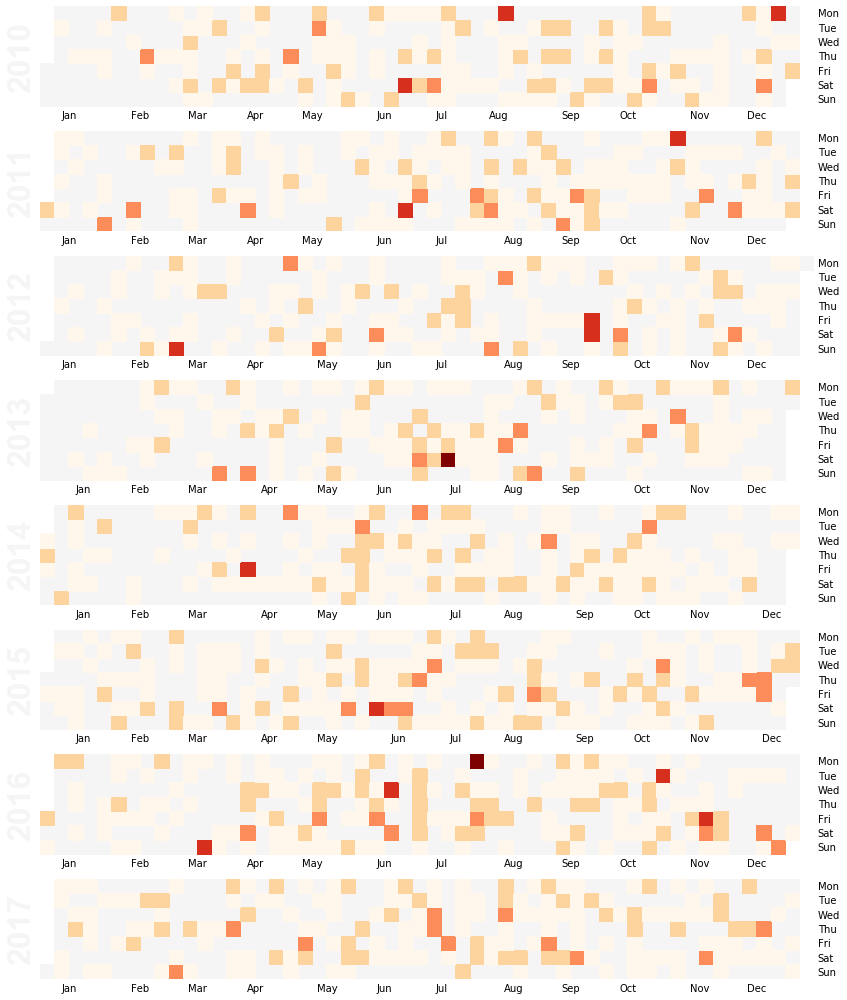

In [13]:
calmap.calendarplot(df[df.CrashSeverity == 5]['incident'], linewidth=0, cmap='OrRd', fig_kws=dict(figsize=(18, 14)));

### Calendar hotspots for all crashes

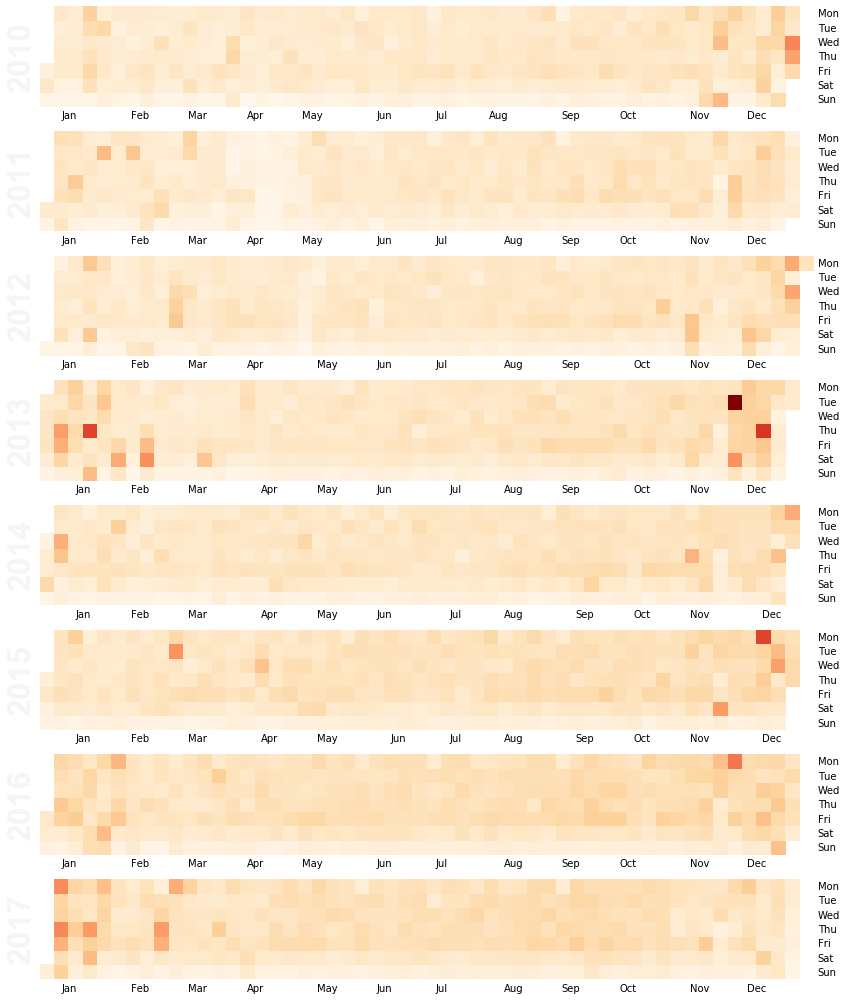

In [14]:
calmap.calendarplot(df['incident'], linewidth=0, cmap='OrRd', fig_kws=dict(figsize=(18, 14)));

We see a high number of crashes in Dec-Jan and low in Feb-Mar. Crashes on weekends are lower, escpecially on Sundays. Fridays seem to have the most number of crashes. However, the most severe crashes are not in winters, but instead in the [100 days of summer](https://highwaysafety.utah.gov/wp-content/uploads/sites/22/2015/02/100-days-of-summer-2007-2016.pdf).

### Weekly trend by the hour

In [15]:
day_week_labels = ['Mon', 'Tues', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
day_week_hr_labels = [day_week_labels[day] + '-' + str(hour)
                      for day in range(0,7)
                      for hour in range(0,25)]
df['day_week_hour'] = df.dayofweek*25 + df.hour

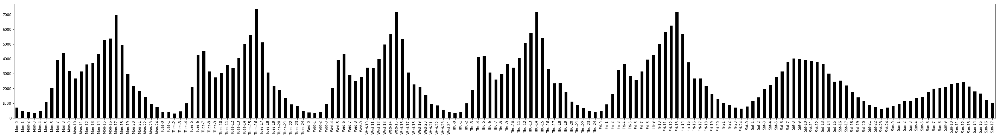

In [16]:
import matplotlib.pyplot as plt

fig = plt.figure()
fig.set_size_inches(50,6)
fig.add_subplot(111)

ax_day_week_hr = df['day_week_hour'].value_counts().sort_index().plot(kind='bar', color='k')
ax_day_week_hr.set_xticklabels(day_week_hr_labels);

### Day of Week

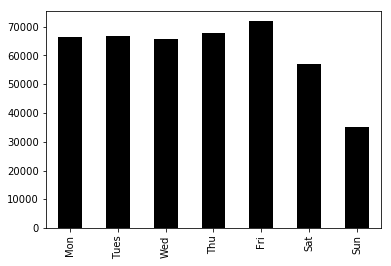

In [17]:
ax = df['dayofweek'].value_counts().sort_index().plot(kind='bar', color='k')
ax.set_xticklabels(day_week_labels);

### Month of Year

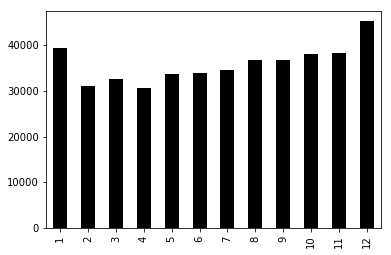

In [18]:
df['month'].value_counts().sort_index().plot(kind='bar', color='k')

### Hour of Day

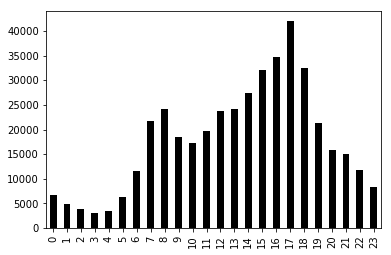

In [19]:
df['hour'].value_counts().sort_index().plot(kind='bar', color='k')

### Yearly trend

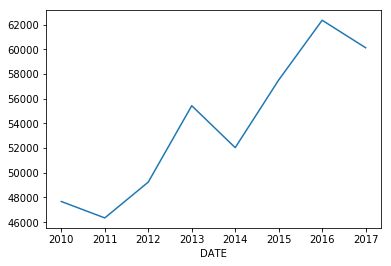

In [20]:
df['incident'].resample('Y').sum().plot()

Accidents are increasing year or year with a dip in 2014

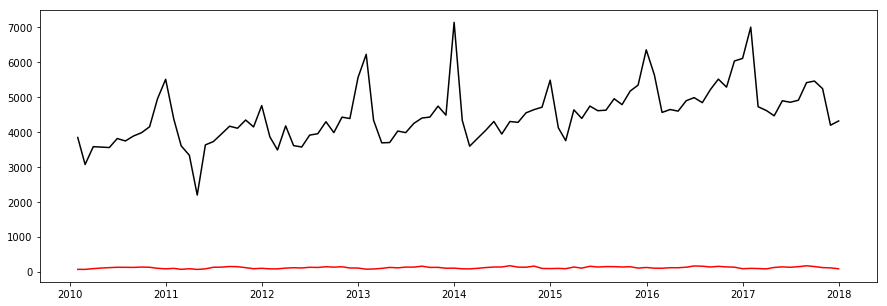

In [21]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(1, 1, 1)

ax.plot(df['incident'].resample('M').sum(), 'k', label='Total crashes')
ax.plot(df[df.CrashSeverity>3]['incident'].resample('M').sum(), 'r', label='Severe crashes')

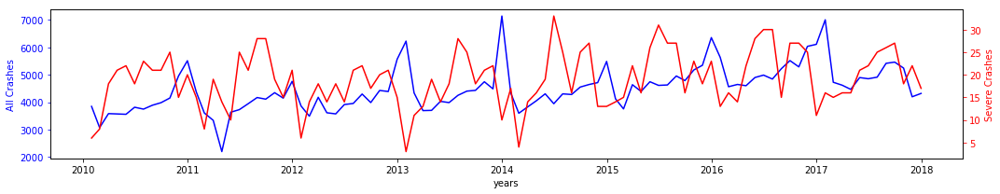

In [22]:
fig = plt.figure(figsize=(15,3))
ax1 = fig.add_subplot(1, 1, 1)
ax1.plot(df['incident'].resample('M').sum(), 'b-')
ax1.set_xlabel('years')
# Make the y-axis label, ticks and tick labels match the line color.
ax1.set_ylabel('All Crashes', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()
ax2.plot(df[df.CrashSeverity==5]['incident'].resample('M').sum(), 'r-')
ax2.set_ylabel('Severe Crashes', color='r')
ax2.tick_params('y', colors='r')

fig.tight_layout()
plt.show()

The number of crashes is increasing every year, and there is a strong seasonality, with most crashes in Nov-Dec and least in Feb-Apr. Feb 2011 has unusually low crashes or missing data (more likely). However, the most severe crashes occur in the summer months.

### Accidents by the roadway junction feature

In [23]:
df.groupby('ROADWAYJUNCTFEATUREID')['ROADWAYJUNCTFEATUREID'].count().sort_values(ascending=False)

ROADWAYJUNCTFEATUREID
No Special Feature/Junction         209114
4-Leg Intersection                  113926
T-Intersection                       41111
Business Drive                       18023
Off-Ramp                              8824
Bridge (overpass/underpass)           7643
Farm/Residential Drive                5938
Ramp Intersection With Crossroad      5247
On-Ramp                               4652
On-Ramp Merge Area                    3878
Off-Ramp Diverge Area                 2556
Other                                 2061
Roundabout                            2001
Unknown                               1822
Railroad Crossing                     1381
Y-Intersection                         852
5-Leg or More Intersection             678
Bike/Ped Path Intersection             567
Crossover in Median                    283
Alley                                  188
Name: ROADWAYJUNCTFEATUREID, dtype: int64

### Visualize all incidents

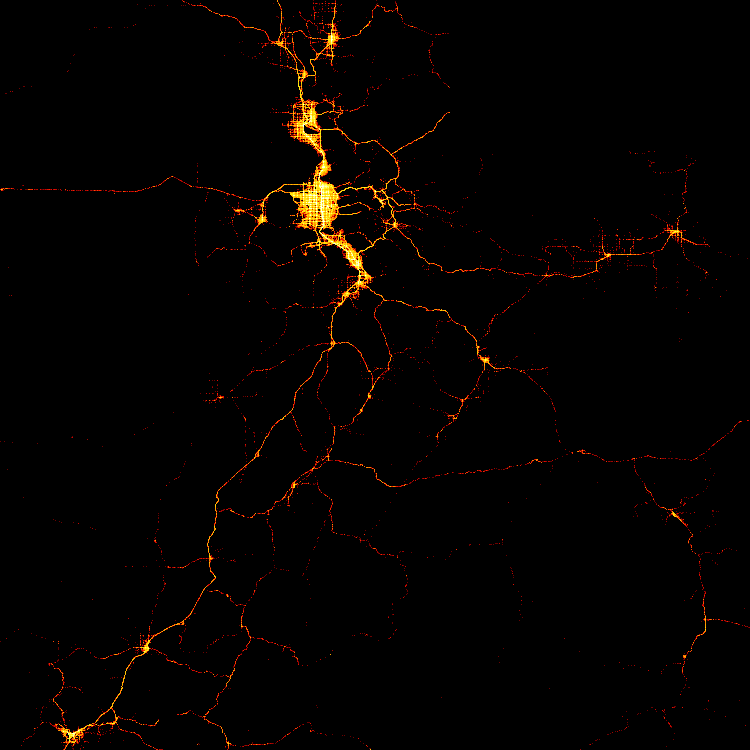

In [24]:
agg = ds.Canvas(750,750).points(df, 'lon','lat')
tf.set_background(tf.shade(agg, cmap=fire),"black")

### Serious crashes

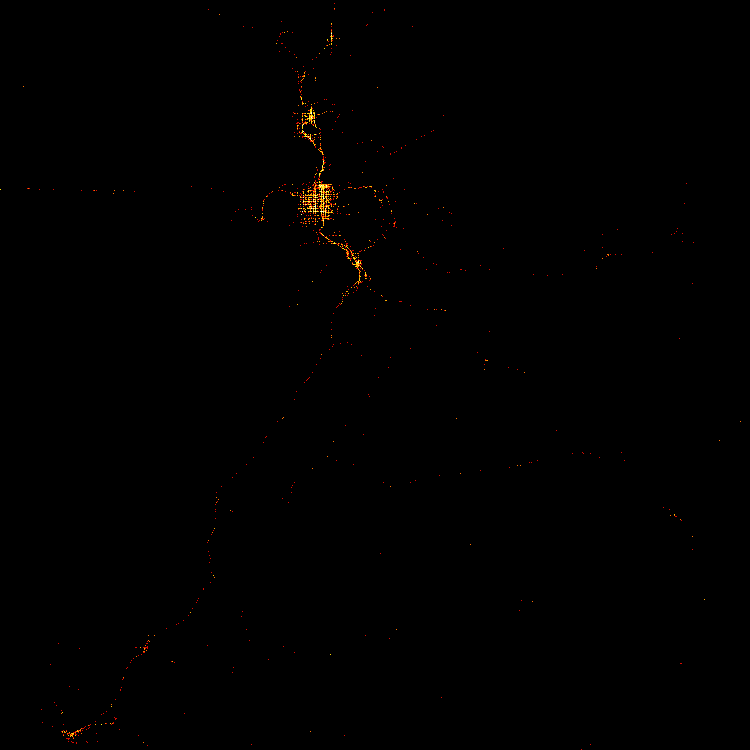

In [25]:
agg = ds.Canvas(750,750).points(df[df['CrashSeverity']>3], 'lon','lat')
tf.set_background(tf.shade(agg, cmap=fire),"black")

### Contributing factors

In [26]:
factors = df.groupby('FIRSTHARMFULEVENTID')['FIRSTHARMFULEVENTID'].count().sort_values(ascending=False)
factors

FIRSTHARMFULEVENTID
Other Motor Vehicle in Transport            290049
Animal - Wild                                20807
Concrete Barrier                             15971
Parked Motor Vehicle (off roadway)           15372
Overturn/Rollover                            12085
Other Non-Fixed Object*                       5617
Fence                                         5567
Pedalcycle                                    5215
Other Fixed Object                            5077
Pedestrian                                    4913
Other Non-Collision*                          4050
Utility Pole/Light Support                    3972
Tree/Shrubbery                                3814
Embankment                                    3415
Thrown or Fallen Object                       3191
Delineator Post                               2795
Animal - Domestic                             2745
Cable Barrier                                 2700
Ditch                                         2668
Traffic Sig

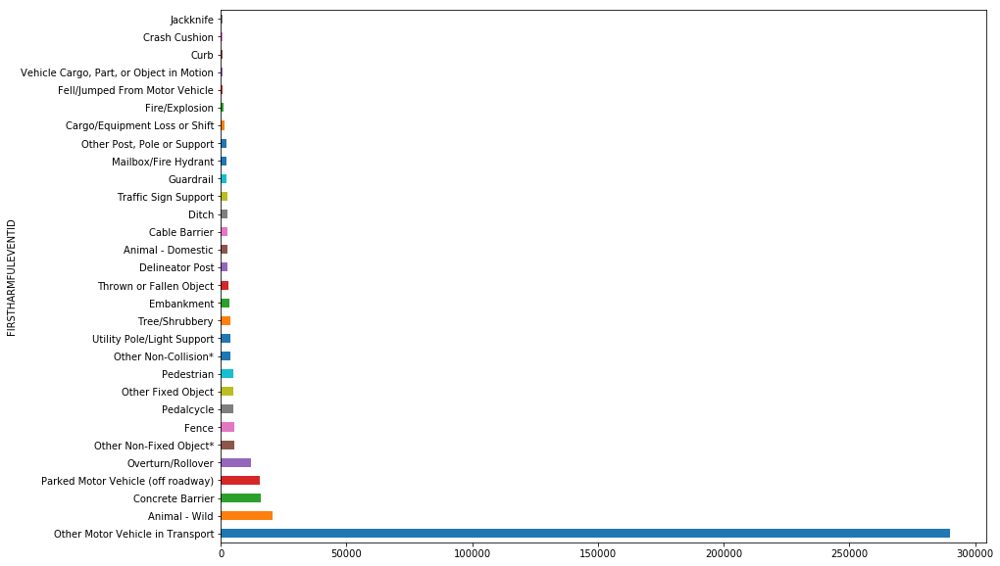

In [27]:
factors[:30].plot(kind='barh', figsize=(14, 10));

### Where do these factors cause collisions?

Other Motor Vehicle in Transport : 290049 incidents,


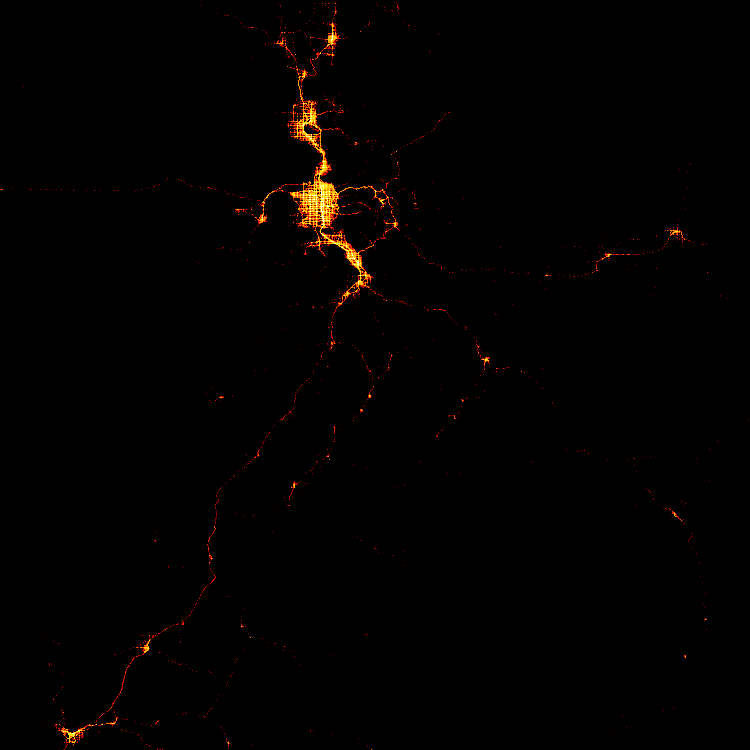

Animal - Wild : 20807 incidents,


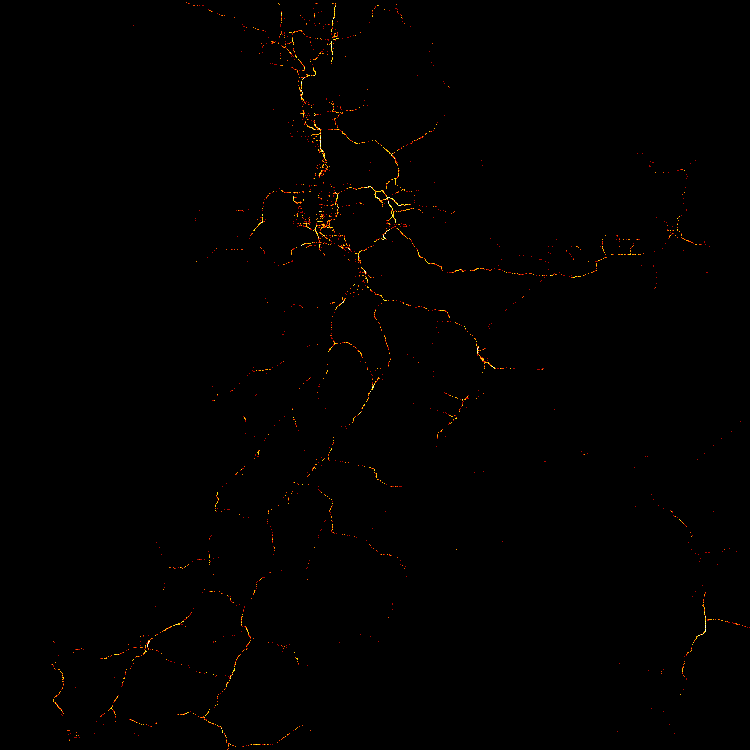

Concrete Barrier : 15971 incidents,


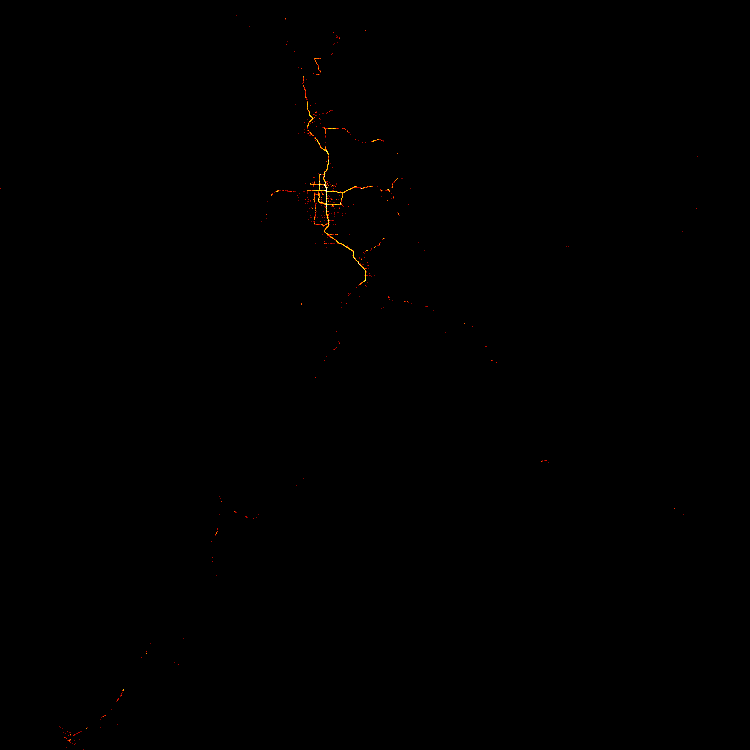

Parked Motor Vehicle (off roadway) : 15372 incidents,


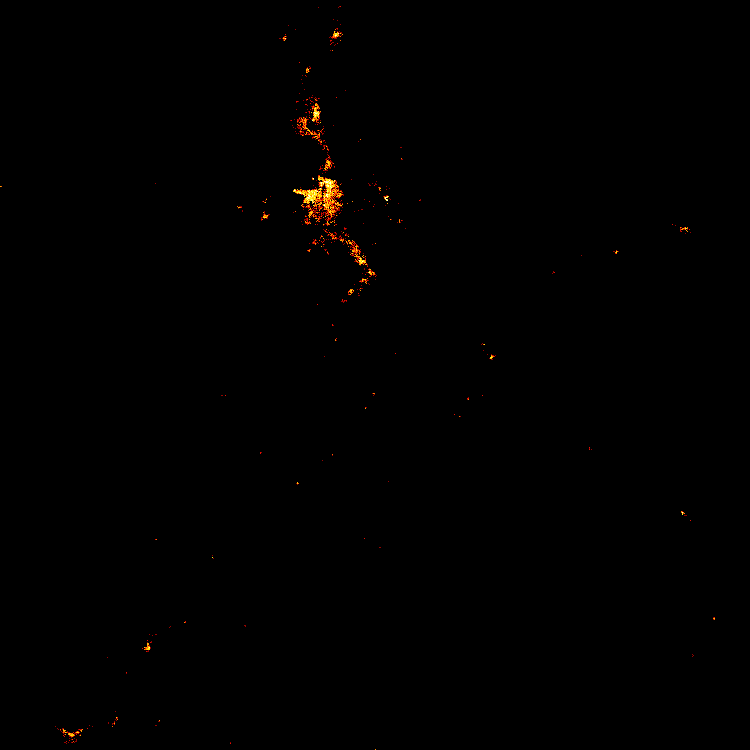

Overturn/Rollover : 12085 incidents,


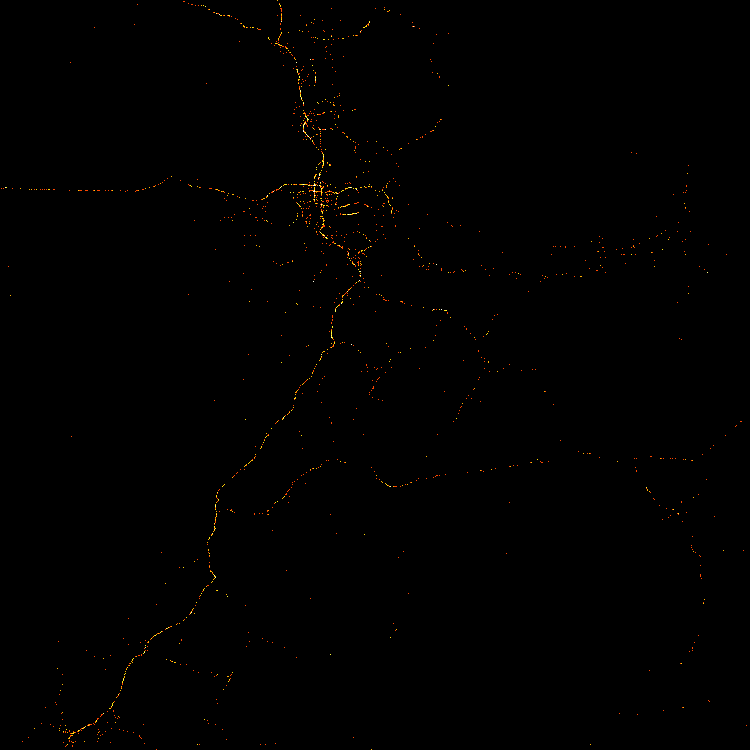

Other Non-Fixed Object* : 5617 incidents,


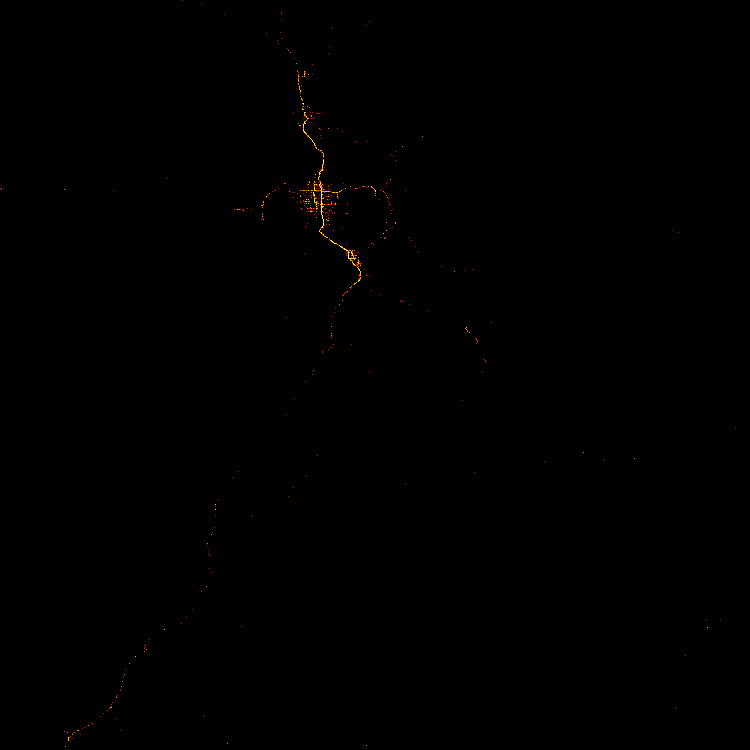

Fence : 5567 incidents,


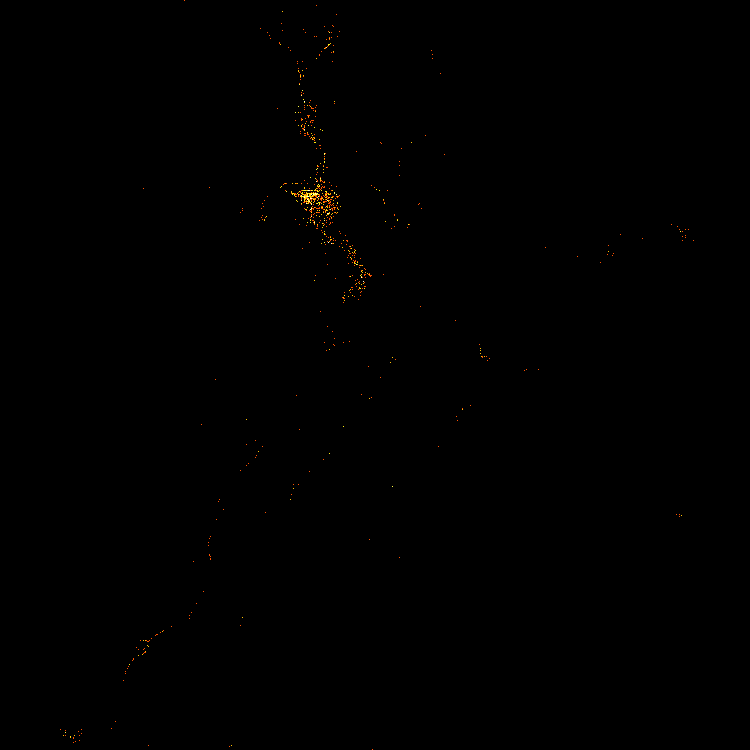

Pedalcycle : 5215 incidents,


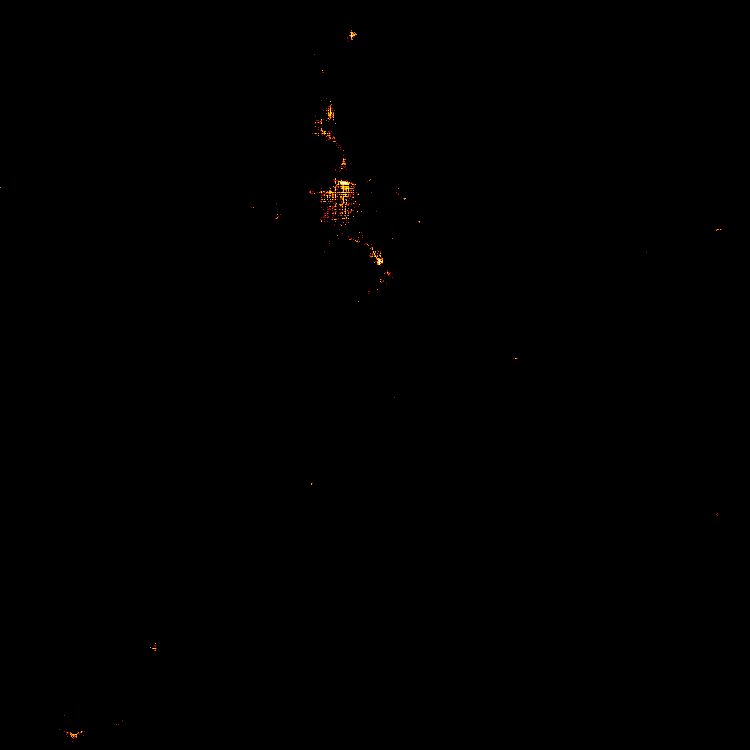

Other Fixed Object : 5077 incidents,


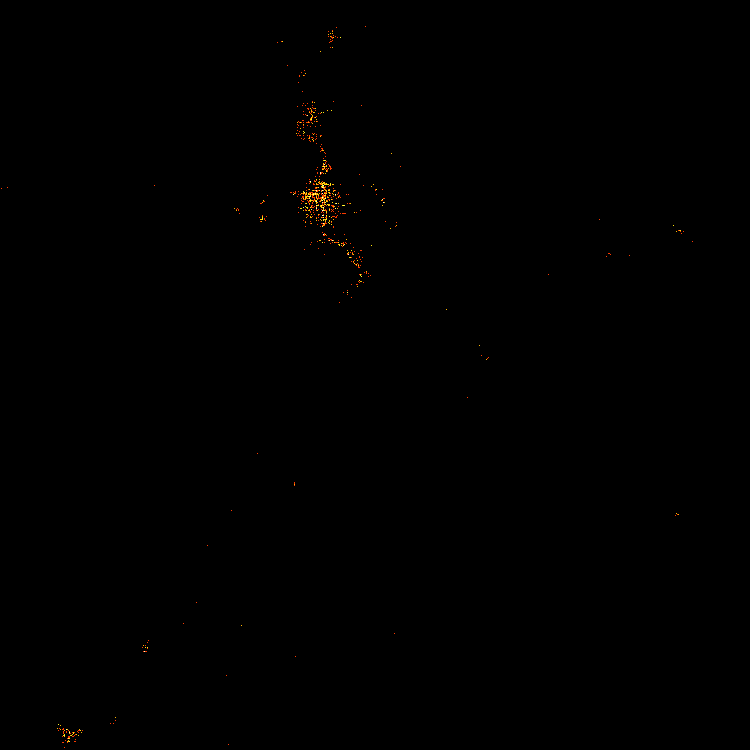

Pedestrian : 4913 incidents,


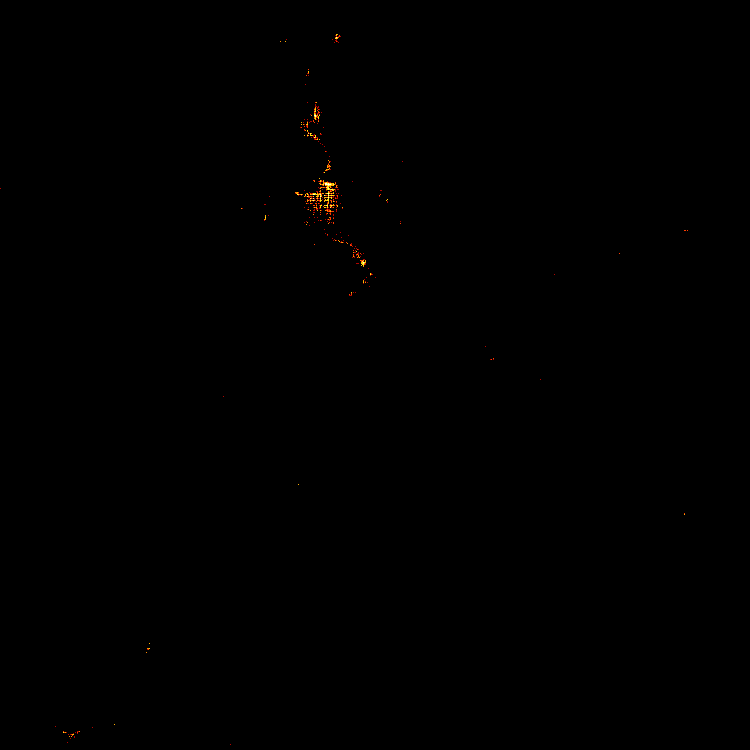

In [28]:
for factor in factors.index[:10]: 
    print
    factor_df = df[df.FIRSTHARMFULEVENTID == factor]
    print('{} : {} incidents,'.format(factor, len(factor_df)))
    agg = ds.Canvas(750,750).points(factor_df, 'lon','lat')
    display(tf.set_background(tf.shade(agg, cmap=fire),"black"))

### Visualize on map

In [29]:
df.loc[:, 'x'], df.loc[:, 'y'] = ds.utils.lnglat_to_meters(df.lon,df.lat)


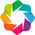

:DynamicMap   []
   :Overlay
      .WMTS.I :WMTS   [Longitude,Latitude]
      .RGB.I  :RGB   [x,y]   (R,G,B,A)

In [30]:
hv.extension('bokeh')

url = 'https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Dark_Gray_Base/MapServer/tile/{z}/{y}/{x}'
tile_opts  = dict(width=1000,height=600,xaxis=None,yaxis=None,bgcolor='black',show_grid=False)
map_tiles  = gv.WMTS(url).opts(style=dict(alpha=0.5), plot=tile_opts)
points     = hv.Points(df, ['x', 'y'])
map_data = datashade(points, x_sampling=1, y_sampling=1, cmap=fire, width=1000, height=600)

map_tiles * map_data

### When and where do collisions take place

In [31]:
df['hourcat'] = df['hour'].astype("category")

In [32]:
y_range = df.y.min(),df.y.max()

In [33]:
x_range = df.x.min(),df.x.max()

In [34]:
extent = x_range, y_range

plot_width  = int(750)
plot_height = int(plot_width//1.2)
background = "black"
export = partial(export_image, export_path="export", background=background)
cm = partial(colormap_select, reverse=(background=="black"))

def base_plot(tools='pan,wheel_zoom,reset',plot_width=plot_width, plot_height=plot_height, **plot_args):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p
    
options = dict(line_color=None, fill_color='blue', size=5)

In [35]:
from bokeh.models import WMTSTileSource

colors = ["#FF0000","#FF3F00","#FF7F00","#FFBF00","#FFFF00","#BFFF00","#7FFF00","#3FFF00",
          "#00FF00","#00FF3F","#00FF7F","#00FFBF","#00FFFF","#00BFFF","#007FFF","#003FFF",
          "#0000FF","#3F00FF","#7F00FF","#BF00FF","#FF00FF","#FF00BF","#FF007F","#FF003F",]

def colorized_images(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'x', 'y', ds.count_cat('hourcat'))
    img = tf.shade(agg, color_key=colors)
    return tf.dynspread(img, threshold=0.3, max_px=4)

p = base_plot(background_fill_color=background)
p.add_tile(WMTSTileSource(url='https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Dark_Gray_Base/MapServer/tile/{z}/{y}/{x}'))
export(colorized_images(*extent),"NYC_collission_times")
InteractiveImage(p, colorized_images)

Here the order of colors is roughly red (midnight), yellow (4am), green (8am), cyan (noon), blue (4pm), purple (8pm), and back to red (since hours and colors are both cyclic).

### Collisions on bike / pedestrian paths

In [36]:
df.ROADWAYJUNCTFEATUREID.unique()

array(['No Special Feature/Junction', 'T-Intersection',
       '4-Leg Intersection', 'Business Drive',
       'Ramp Intersection With Crossroad', 'On-Ramp Merge Area',
       'On-Ramp', 'Bridge (overpass/underpass)', 'Off-Ramp', 'Other',
       'Off-Ramp Diverge Area', 'Unknown', 'Y-Intersection',
       'Farm/Residential Drive', 'Railroad Crossing',
       '5-Leg or More Intersection', 'Crossover in Median',
       'Bike/Ped Path Intersection', 'Roundabout', 'Alley'], dtype=object)

In [37]:
basemap = WMTSTileSource(url='https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}')

def create_image_dfx(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(dfx, 'x','y')
    img = tf.shade(agg.where(agg>np.percentile(agg,90)), cmap=inferno, how='eq_hist')
    return tf.dynspread(img, threshold=0.3, max_px=4)

dfx = df[df['ROADWAYJUNCTFEATUREID']=='Bike/Ped Path Intersection']
p = base_plot()
p.add_tile(basemap)
export(create_image_dfx( *extent),"BikePed Path Intersection")
InteractiveImage(p, create_image_dfx)

### The most dangerous roads in Utah

In [38]:
streets = df.groupby('RouteName')['RouteName']
count = streets.count()
count.sort_values(ascending=False, inplace=True)
print(count[:20])

RouteName
0015P    36231
0015N    30131
0089P    25649
0068P    10917
0171P     7449
0071P     6519
0091P     6057
0154P     5879
0080P     5549
0080N     5311
0040P     5136
P         4729
0209P     4615
0173P     4422
0126P     4380
0189P     4244
2172P     4120
0215P     3891
0266P     3713
0215N     3610
Name: RouteName, dtype: int64


Data sourced from https://data-uplan.opendata.arcgis.com/